# Weak lensing – Notebook 25th January 2024 to ...

In [1]:
%matplotlib inline

import os
import yaml
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.path as mpath
from scipy import ndimage, signal, stats, optimize

import astropy as ap
from lenspack.utils import bin2d
from lenspack.image.inversion import ks93, ks93inv

In [2]:
with open('../config.yml', 'r') as file:
    config_data = yaml.safe_load(file)

KTNG_DIR = os.path.expanduser(config_data['ktng_dir'])
TRECS_DIR = os.path.expanduser(config_data['trecs_dir'])
TRECS_FILE = config_data['trec_file']

REDSHIFTS = [0.506, 1.034, 1.532] # red shifts for the simulated convergence maps
FILENAMES = ['kappa13', 'kappa23', 'kappa30'] # corresponding filenames

In [3]:
width_ori = 1024  # size of the simulated convergence maps (nb pixels)
width = 360 # size of the target convergence maps (nb pixels)
size_ori = 5.0  # opening angle of the simulated convergence maps (deg)
size = size_ori * width / width_ori # opening angle of the target convergence maps (deg)

resolution = size / width * 60. # arcmin/pixel
print(f"Resolution = {resolution:.2f} arcmin/pixel")

Resolution = 0.29 arcmin/pixel


## 2024-01-25 & 26

### Generate calibration and test sets from kappaTNG

In [4]:
index_redshift = 2

bin_file = f"{FILENAMES[index_redshift]}.dat"
png_file = f"{FILENAMES[index_redshift]}.png"

redshift = REDSHIFTS[index_redshift]

In [5]:
ninpimgs = 50
list_of_idx = np.arange(ninpimgs) + 1
vectorized_zfill = np.vectorize(lambda x: str(x).zfill(3))
list_of_idx = vectorized_zfill(list_of_idx)

n_samples_per_side = 3

In [6]:
def split_map(kappa, n_samples_per_side):

    step = (width_ori - width) // (n_samples_per_side - 1)
    out = []
    beg_i = 0
    for i in range(n_samples_per_side):
        beg_j = 0
        for j in range(n_samples_per_side):
            subkappa = kappa[beg_i:beg_i+width, beg_j:beg_j+width]
            subkappa = subkappa - np.mean(subkappa) # Center-normalize the convergence map
            out.append(subkappa)
            beg_j += step
        beg_i += step

    return out

In [7]:
list_of_kappa = []
vmin = np.inf
vmax = -np.inf
for idx in list_of_idx:
    fname = os.path.join(KTNG_DIR, f"run{idx}", bin_file)
    with open(fname, 'rb') as f:
        dummy = np.fromfile(f, dtype="int32", count=1)
        kappa = np.fromfile(f, dtype="float", count=width_ori*width_ori)
        dummy = np.fromfile(f, dtype="int32", count=1)
    kappa = kappa.reshape((width_ori, width_ori))
    fname_png = os.path.join(KTNG_DIR, f"run{idx}", png_file)
    list_of_kappa += split_map(kappa, n_samples_per_side)
    vmin = min(vmin, np.min(kappa))
    vmax = max(vmax, np.max(kappa))

kappa = np.stack(list_of_kappa)
np.random.shuffle(kappa)
nimgs = kappa.shape[0]

Set size of the calibration and test sets:

In [8]:
nimgs_calib = 100
nimgs_test = nimgs - nimgs_calib

Create shear maps from the convergence maps:

In [9]:
vectorized_ks93 = np.vectorize(ks93, signature='(n,m),(n,m)->(n,m),(n,m)')
vectorized_ks93inv = np.vectorize(ks93inv, signature='(n,m),(n,m)->(n,m),(n,m)')

In [10]:
bmode = np.zeros((nimgs, width, width)) # no B-mode (convergence maps are real-valued)
gamma1, gamma2 = vectorized_ks93inv(kappa, bmode)
gamma2 = -gamma2 # use convention from jax_lensing (due to the inversion of the x-axis?)
vmax_gamma = max(
    np.max(gamma1), np.max(gamma2), -np.min(gamma1), -np.min(gamma2)
)

### Use data from the T-RECS catalog
*https://github.com/abonaldi/TRECS*

As for ShapeNet [1], we will use the dataset of star-forming galaxies (SFGs) from the T-RECS simulated catalog [2]. According to this paper, it "can be used for simulating observations and predicting results from deep radio surveys with existing and forthcoming radio facilities, such as SKA."

[1] F. Nammour et al., “ShapeNet: Shape constraint for galaxy image deconvolution,” Astronomy and Astrophysics, vol. 663, p. A69, Jul. 2022.

[2] A. Bonaldi et al., “The Tiered Radio Extragalactic Continuum Simulation (T-RECS),” Monthly Notices of the Royal Astronomical Society, vol. 482, no. 1, pp. 2–19, Jan. 2019.

#### Get statistics from the COSMOS catalog

In [11]:
%store -r ra_cosmos_mean dec_cosmos_mean extent

#### Open T-RECS catalogue

The dataset can be dowloaded from this [ftp server](http://cdsarc.u-strasbg.fr/ftp/VII/282/fits/).

In [12]:
catalog_sfg = ap.io.fits.open(os.path.join(TRECS_DIR, TRECS_FILE))
catdata_sfg = catalog_sfg[1].data

Discard objects that are larger than 10 pixels and smaller than 70 pixels on the sky:

Filter by redshift:

In [13]:
# From A. Bonaldi et al., “The Tiered Radio Extragalactic Continuum Simulation (T-RECS),”
# Monthly Notices of the Royal Astronomical Society, vol. 482, no. 1, pp. 2–19, Jan. 2019.
min_redshift = 0.
max_redshift = 8.
#n_snapshots = 201 # as in the original simulation, but the bins are too small (not enough galaxies per pixel)
n_snapshots = 21
bins_redshift = np.linspace(min_redshift, max_redshift, n_snapshots)

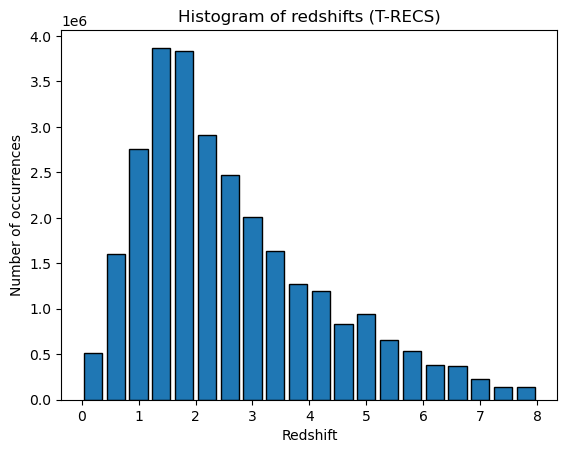

In [14]:
redshifts = catdata_sfg["redshift"]

plt.hist(
    redshifts, bins=bins_redshift, align='mid', edgecolor='black', rwidth=0.8
)
plt.xlabel('Redshift')
plt.ylabel('Number of occurrences')
plt.title('Histogram of redshifts (T-RECS)')
plt.show()

In [15]:
binindex = np.digitize(redshift, bins_redshift) - 1

filter_redshift = np.logical_and(
    redshifts >= bins_redshift[binindex],
    redshifts < bins_redshift[binindex+1]
)
catdata_sfg = catdata_sfg[filter_redshift]

print(f"Redshift of the simulated convergence maps = {redshift:.2f}")
print(f"Redshift interval = [{bins_redshift[binindex]:.2f}, {bins_redshift[binindex+1]:.2f}]")

Redshift of the simulated convergence maps = 1.53
Redshift interval = [1.20, 1.60]


Get sizes, coordinates, ellipticities, and redshifts:

In [16]:
size_sfg = catdata_sfg['size']

# Coordinates (in degree)
ra_sfg = catdata_sfg['longitude'].copy()
dec_sfg = catdata_sfg['latitude'].copy()

# Rotate the coordinates to get the same extent as the COSMOS catalog
ra_sfg = (ra_sfg + ra_cosmos_mean) % 360
dec_sfg = (dec_sfg + dec_cosmos_mean) % 360

# Ellipticities
e1_sfg = catdata_sfg['e1']
e2_sfg = catdata_sfg['e2']

Create a map of number of galaxies per pixel:

In [17]:
def shift_coords(coord, mean_coord):
    min_coord = mean_coord - 180
    return (coord - min_coord) % 360 + min_coord

In [18]:
ra_sfg_shifted = shift_coords(ra_sfg, ra_cosmos_mean)
dec_sfg_shifted = shift_coords(dec_sfg, dec_cosmos_mean)

n_gal_map_sfg = bin2d(
    ra_sfg_shifted, dec_sfg_shifted, npix=width,
    extent=extent
)

print(f"Number of selected galaxies within the boundaries = {np.sum(n_gal_map_sfg):.0f}")

Number of selected galaxies within the boundaries = 481498


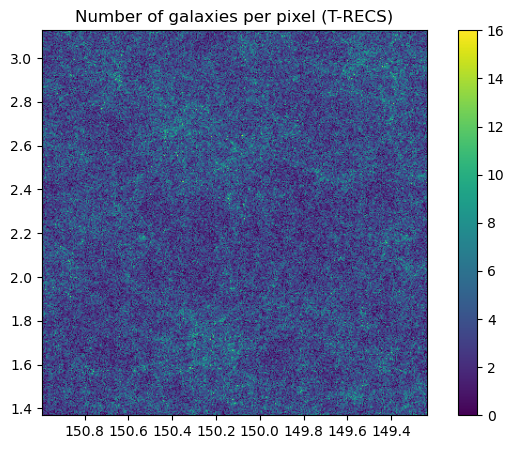

In [19]:
plt.figure(figsize=(8, 5))
plt.imshow(
    n_gal_map_sfg, origin='lower',
    extent=extent
)
plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
plt.colorbar()
plt.title("Number of galaxies per pixel (T-RECS)")
plt.show()

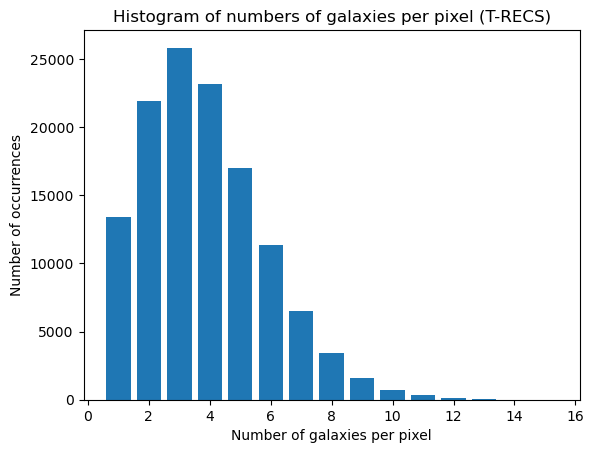

In [20]:
plt.hist(
    n_gal_map_sfg.flatten(), bins=np.arange(1, n_gal_map_sfg.max() + 1) - 0.5,
    align='mid', rwidth=0.8
)
plt.xlabel('Number of galaxies per pixel')
plt.ylabel('Number of occurrences')
plt.title('Histogram of numbers of galaxies per pixel (T-RECS)')
plt.show()

Create binary mask for empty pixels:

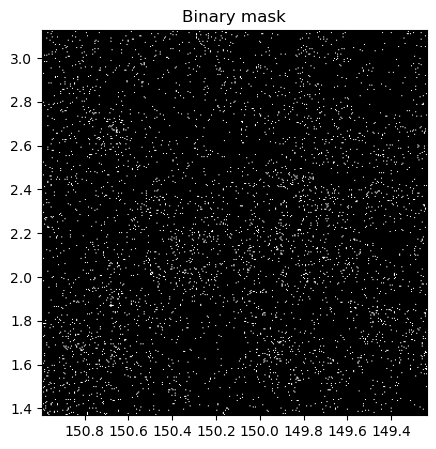

In [21]:
plt.figure(figsize=(5, 5))
mask_sfg = (n_gal_map_sfg == 0)
plt.imshow(mask_sfg, cmap='gray', origin='lower', extent=extent)
plt.xlim(plt.gca().get_xlim()[::-1])
plt.title("Binary mask")
plt.show()

Estimate shape dispersion of galaxies:

In [22]:
shapedisp1_sfg = np.std(e1_sfg)
shapedisp2_sfg = np.std(e2_sfg)

print(f"Shape dispersion 1 = {shapedisp1_sfg:.3f}")
print(f"Shape dispersion 2 = {shapedisp2_sfg:.3f}")

Shape dispersion 1 = 0.252
Shape dispersion 2 = 0.252


#### Add noise and mask from the T-RECS catalog

For masked data, we set in practice a variance which makes the SNR very small, such that the signal becomes dominated by the noise:

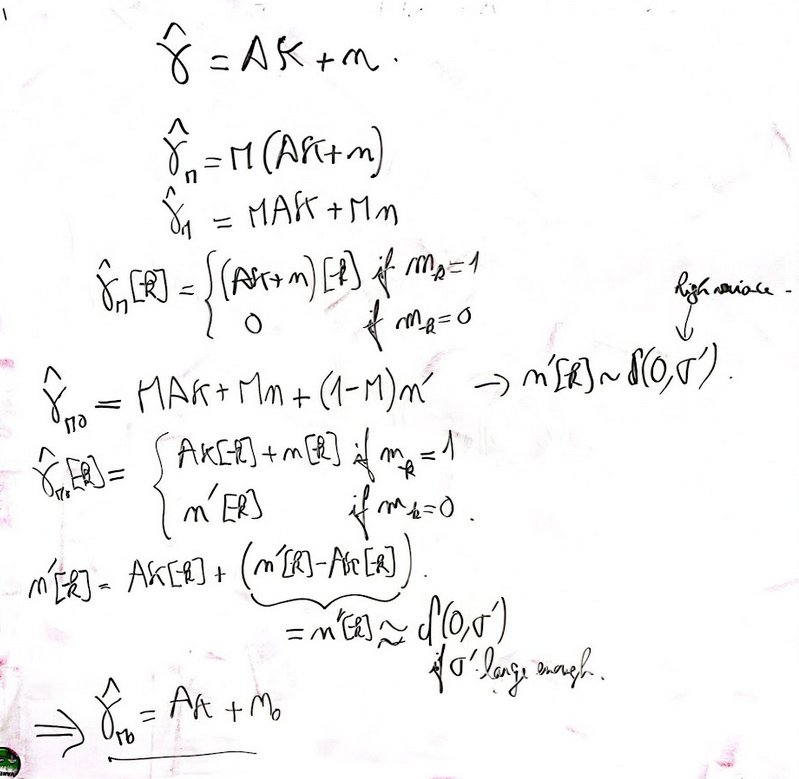

In [23]:
multfact_stdnoise = 10
sqnorm_gamma = (
    np.linalg.norm(gamma1)**2 + np.linalg.norm(gamma2)**2
) / (nimgs * width**2) # normalized squared norm
stdnoise_mask = multfact_stdnoise * np.sqrt(sqnorm_gamma / 2)

In [24]:
test_noise_1 = stdnoise_mask * np.random.randn(width, width)
test_noise_2 = stdnoise_mask * np.random.randn(width, width)

# Compute the power of the signal and noise
signal_power = (np.linalg.norm(gamma1)**2 + np.linalg.norm(gamma2)**2) / nimgs
noise_power = np.linalg.norm(test_noise_1)**2 + np.linalg.norm(test_noise_2)**2

# Compute SNR in decibels
snr_db = 10 * np.log10(signal_power / noise_power)

print(f"Signal power = {signal_power:.0e}")
print(f"Noise power = {noise_power:.0e}")
print(f"SNR = {snr_db:.1f}db")

Signal power = 1e+02
Noise power = 1e+04
SNR = -20.0db


In [25]:
shapedisp_sfg = (shapedisp1_sfg + shapedisp2_sfg) / 2
std_sfg = np.nan_to_num(
    shapedisp_sfg / np.sqrt(n_gal_map_sfg), posinf=stdnoise_mask
)

/tmp/ipykernel_71644/941835528.py:3: RuntimeWarning: divide by zero encountered in divide
  shapedisp_sfg / np.sqrt(n_gal_map_sfg), posinf=stdnoise_mask


In [26]:
# Set masked values to 0
gamma1_masked_sfg = (1 - mask_sfg) * gamma1
gamma2_masked_sfg = (1 - mask_sfg) * gamma2

# Add noise to the shear maps
gamma1_noisy_sfg = gamma1_masked_sfg + std_sfg * np.random.randn(nimgs, width, width)
gamma2_noisy_sfg = gamma2_masked_sfg + std_sfg * np.random.randn(nimgs, width, width)

In [27]:
nexamples = 2
saturation = 0.6
rand_idx = np.random.randint(
    low=nimgs_calib, high=nimgs, size=nexamples
) # random indices within the test set (the first images are used for calibration)

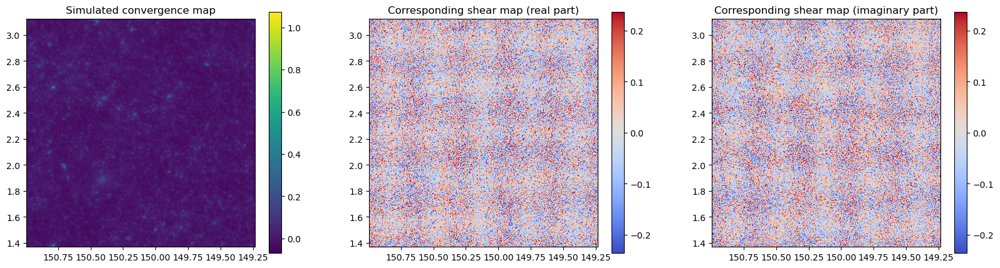

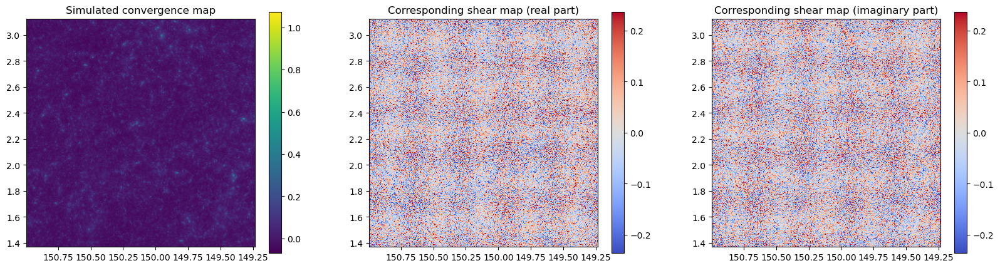

In [28]:
for i, idx in enumerate(rand_idx):
    ka = kappa[idx]
    ga1, ga2 = gamma1_noisy_sfg[idx], gamma2_noisy_sfg[idx]

    plt.figure(figsize=(20, 5))

    plt.subplot(131)
    plt.imshow(ka, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.title("Simulated convergence map")

    plt.subplot(132)
    plt.imshow(
        ga1, cmap='coolwarm', origin='lower',
        vmin=-saturation*vmax_gamma, vmax=saturation*vmax_gamma, extent=extent
    )
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.title("Corresponding shear map (real part)")

    plt.subplot(133)
    plt.imshow(
        ga2, cmap='coolwarm', origin='lower',
        vmin=-saturation*vmax_gamma, vmax=saturation*vmax_gamma, extent=extent
    )
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.title("Corresponding shear map (imaginary part)")

    plt.show()

#### Apply the KS filter to the noisy shear maps

In [29]:
std_gaussianfilter = 2.

kappa_ks_sfg, _ = vectorized_ks93(gamma1_noisy_sfg, -gamma2_noisy_sfg)
kappa_ks_sfg = ndimage.gaussian_filter(
    kappa_ks_sfg, std_gaussianfilter, mode="wrap", axes=(1, 2)
)

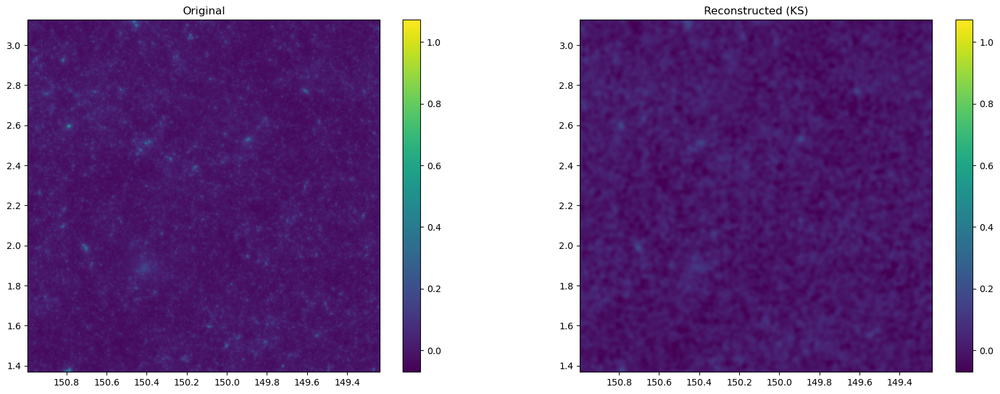

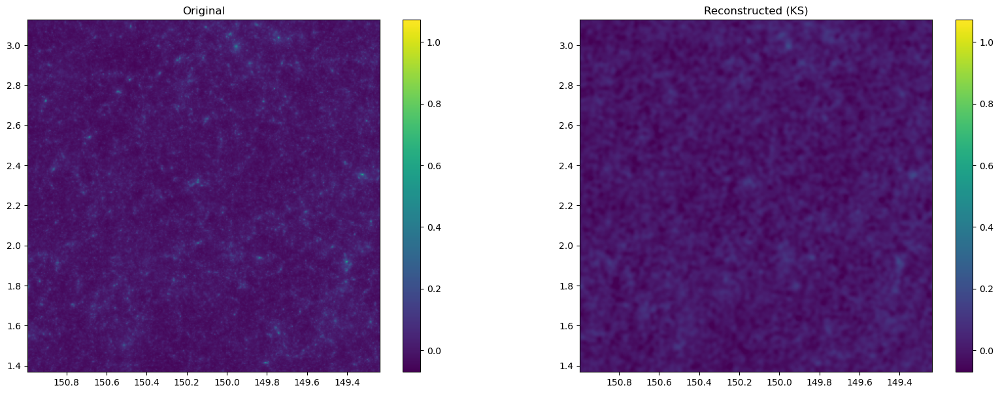

In [30]:
for i, idx in enumerate(rand_idx):
    ka_ori = kappa[idx] # original
    ka_ks = kappa_ks_sfg[idx] # reconstructed

    plt.figure(figsize=(20, 7))

    plt.subplot(121)
    plt.imshow(ka_ori, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.title("Original")

    plt.subplot(122)
    plt.imshow(ka_ks, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis  
    plt.colorbar()
    plt.title("Reconstructed (KS)")

    plt.show()

## 2024-01-29

### Use data from the T-RECS catalog (next)

#### Get standard deviation of the KS estimate

In [31]:
dirac_real = np.zeros((width, width))
dirac_real[-1, -1] = 1.

dirac_imag = np.zeros((width, width))

ksmatr_real, ksmatr_imag = ks93(dirac_real, dirac_imag)
ksmatr_gaussian_real = ndimage.gaussian_filter(ksmatr_real, std_gaussianfilter, mode="wrap")
ksmatr_gaussian_imag = ndimage.gaussian_filter(ksmatr_imag, std_gaussianfilter, mode="wrap")
ksmatr_gaussian_sqmodule = ksmatr_gaussian_real**2 + ksmatr_gaussian_imag**2

ksmatr_gaussian_sqmodule = np.fft.fftshift(ksmatr_gaussian_sqmodule) # for convolution

# Crop convolution kernel for efficiency (fast-decaying coefficients)
crop_width = 32
start = (width - crop_width) // 2
ksmatr_gaussian_sqmodule = ksmatr_gaussian_sqmodule[
    start:start+crop_width, start:start+crop_width
]

std_ks_sfg = np.sqrt(signal.convolve2d(std_sfg**2, ksmatr_gaussian_sqmodule, mode="same", boundary="wrap"))

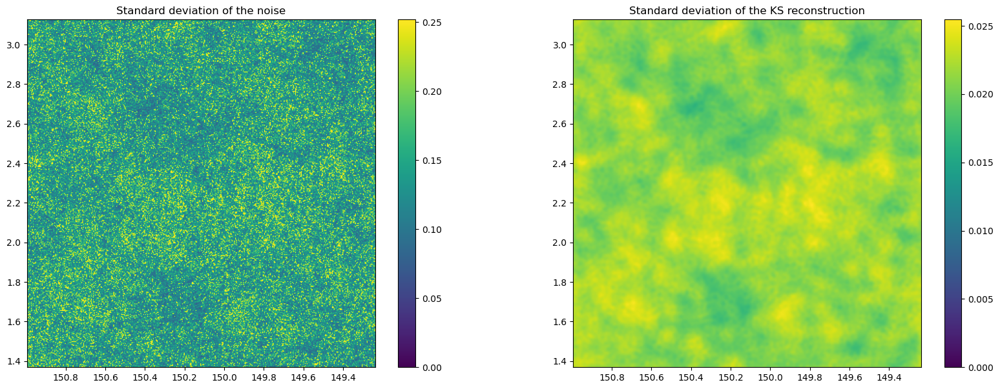

In [32]:
saturation = 1.
maxval = saturation * np.max(std_ks_sfg)

plt.figure(figsize=(20, 7))

plt.subplot(121)
plt.imshow(
    std_sfg, origin='lower', vmin=0., extent=extent
)
plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
plt.colorbar()
plt.title("Standard deviation of the noise")

plt.subplot(122)
plt.imshow(
    std_ks_sfg, origin='lower', vmin=0., vmax=maxval, extent=extent
)
plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
plt.colorbar()
plt.title("Standard deviation of the KS reconstruction")

plt.show()

#### Compute lower and upper residuals

In [33]:
confidence = 2 # Level of confidence (n-sigma)
alpha = 2 - 2 * stats.norm.cdf(confidence)
ppf_sfg = confidence * std_ks_sfg
print(f"Confidence level of {confidence}-sigma --> alpha = {alpha:.1e}")

Confidence level of 2-sigma --> alpha = 4.6e-02


In [34]:
kappa_smoothed = ndimage.gaussian_filter(
    kappa, std_gaussianfilter, mode="wrap", axes=(1, 2)
)

# Lower and upper bounds
kappa_lo_sfg = kappa_ks_sfg - ppf_sfg
kappa_hi_sfg = kappa_ks_sfg + ppf_sfg

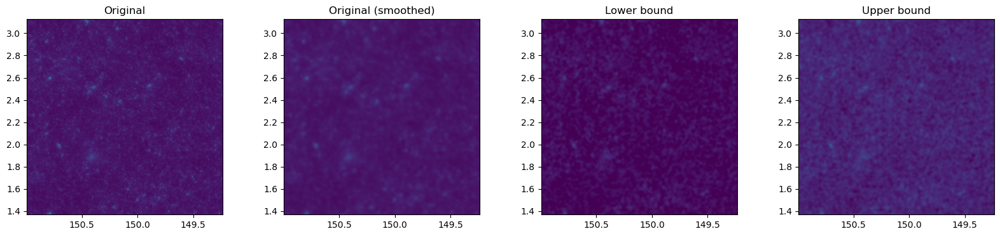

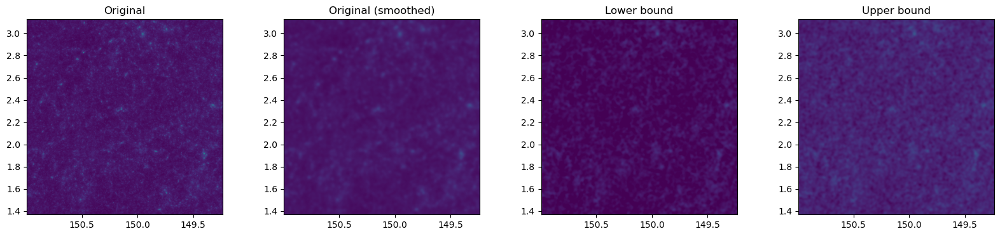

In [35]:
for i, idx in enumerate(rand_idx):
    ka_ori = kappa[idx] # original (non-smoothed)
    ka_ori_smoothed = kappa_smoothed[idx] # original (smoothed)
    ka_lo = kappa_lo_sfg[idx] # lower bound
    ka_hi = kappa_hi_sfg[idx] # upper bound

    plt.figure(figsize=(20, 4))

    plt.subplot(141)
    plt.imshow(ka_ori, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.title("Original")

    plt.subplot(142)
    plt.imshow(ka_ori_smoothed, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.title("Original (smoothed)")

    plt.subplot(143)
    plt.imshow(ka_lo, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.title("Lower bound")

    plt.subplot(144)
    plt.imshow(ka_hi, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.title("Upper bound")

    plt.show()

#### Split arrays into calibration and test sets

In [36]:
def split_test_calib(arr, nimgs_calib):
    arr_calib = arr[:nimgs_calib]
    arr_test = arr[nimgs_calib:]
    return arr_calib, arr_test

In [37]:
list_of_arrs = [
    kappa, kappa_smoothed, kappa_ks_sfg, kappa_lo_sfg, kappa_hi_sfg,
    gamma1, gamma2, gamma1_noisy_sfg, gamma2_noisy_sfg
]

list_of_arrs_calib, list_of_arrs_test = [], []
for arr in list_of_arrs:
    arr_calib, arr_test = split_test_calib(arr, nimgs_calib)
    list_of_arrs_calib.append(arr_calib)
    list_of_arrs_test.append(arr_test)

kappa_calib, kappa_smoothed_calib, kappa_ks_sfg_calib, kappa_lo_sfg_calib, kappa_hi_sfg_calib, \
    gamma1_calib, gamma2_calib, gamma1_noisy_sfg_calib, gamma2_noisy_sfg_calib = list_of_arrs_calib

kappa_test, kappa_smoothed_test, kappa_ks_sfg_test, kappa_lo_sfg_test, kappa_hi_sfg_test, \
    gamma1_test, gamma2_test, gamma1_noisy_sfg_test, gamma2_noisy_sfg_test = list_of_arrs_test

#### Accuracy of the prediction intervals

In [38]:
# Use **kwargs for argument `axis`, for instance
def loss(kappa, kappa_lo, kappa_hi, mask=None, **kwargs):
    ill_predicted = (kappa < kappa_lo) | (kappa > kappa_hi)
    if mask is not None:
        ill_predicted *= mask
        npixels = np.sum(mask)
    else:
        npixels = width**2
    return np.sum(ill_predicted, **kwargs) / npixels

Unbiased estimator (prediction bounds for $S\kappa$):

In [39]:
losses_sfg_unbiased_test = loss(
    kappa_smoothed_test, kappa_lo_sfg_test, kappa_hi_sfg_test,
    axis=(1, 2)
)

print(f"Mean value = {np.mean(losses_sfg_unbiased_test):.1e}")
print(f"Standard deviation = {np.std(losses_sfg_unbiased_test):.1e}")
print(f"Target = {alpha:.1e}")

Mean value = 5.2e-02
Standard deviation = 2.6e-03
Target = 4.6e-02


Biased estimator (prediction bounds for $\kappa$):

In [40]:
losses_sfg_biased_test = loss(
    kappa_test, kappa_lo_sfg_test, kappa_hi_sfg_test,
    axis=(1, 2)
)

print(f"Mean value = {np.mean(losses_sfg_biased_test):.1e}")
print(f"Standard deviation = {np.std(losses_sfg_biased_test):.1e}")
print(f"Target = {alpha:.1e}")

Mean value = 1.3e-01
Standard deviation = 4.4e-03
Target = 4.6e-02


Plot losses for test data:

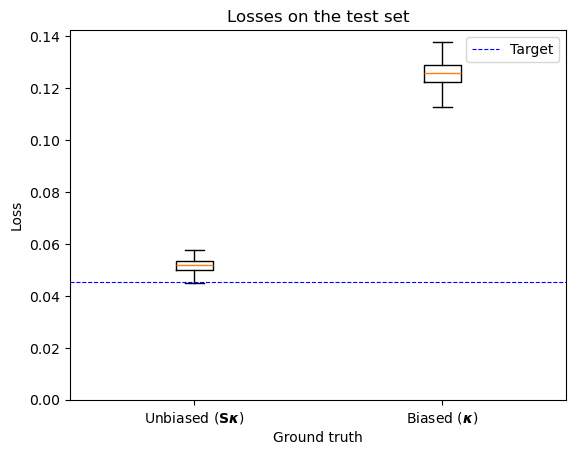

In [41]:
plt.boxplot([
    losses_sfg_unbiased_test,
    losses_sfg_biased_test
])
plt.ylim(bottom=0.)
plt.xticks([1, 2], [
    r"Unbiased ($\mathbf{S}\boldsymbol{\kappa}$)",
    r"Biased ($\boldsymbol{\kappa}$)"
])
plt.xlabel("Ground truth")
plt.ylabel("Loss")
plt.axhline(y=alpha, color='blue', linestyle='--', linewidth=0.8, label='Target')
plt.legend()
plt.title("Losses on the test set")
plt.show()

#### Calibration with conformalized quantile regression (CQR)

In [42]:
conformity_scores_unbiased = np.maximum(
    kappa_lo_sfg_calib - kappa_smoothed_calib,
    kappa_smoothed_calib - kappa_hi_sfg_calib
)

conformity_scores_biased = np.maximum(
    kappa_lo_sfg_calib - kappa_calib,
    kappa_calib - kappa_hi_sfg_calib
)

adjusted_quantile = (1 - alpha) * (1 + 1/nimgs_calib) # adjusted quantile (finite sample correction)
quantile_vals_unbiased = np.percentile(conformity_scores_unbiased, adjusted_quantile*100, axis=0)
quantile_vals_biased = np.percentile(conformity_scores_biased, adjusted_quantile*100, axis=0)

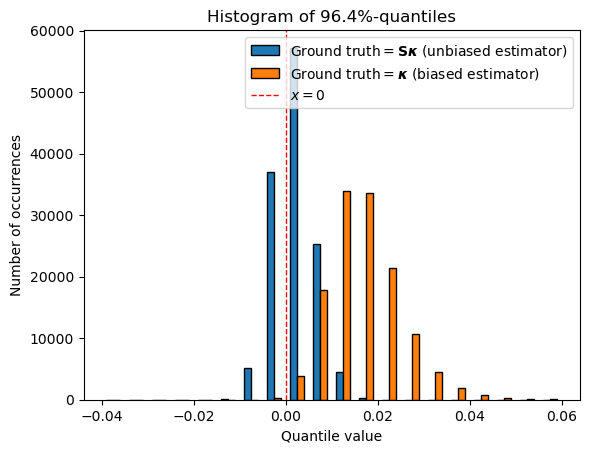

In [43]:
qmin, qmax = -0.04, 0.06
nbins = 20
bins = np.linspace(qmin, qmax, nbins+1)
dval = (vmax - vmin) / nbins
plt.hist(
    [quantile_vals_unbiased.flatten(), quantile_vals_biased.flatten()],
    bins=bins, edgecolor='black', align='mid', rwidth=0.6, label=[
        r"Ground truth$=\mathbf{S} \boldsymbol{\kappa}$ (unbiased estimator)",
        r"Ground truth$=\boldsymbol{\kappa}$ (biased estimator)"
    ]
)
plt.axvline(x=0, color='red', linestyle='dashed', linewidth=1., label=r'$x = 0$')
plt.xlabel('Quantile value')
plt.ylabel('Number of occurrences')
plt.legend()
plt.title(f'Histogram of {adjusted_quantile:.1%}-quantiles')
plt.show()

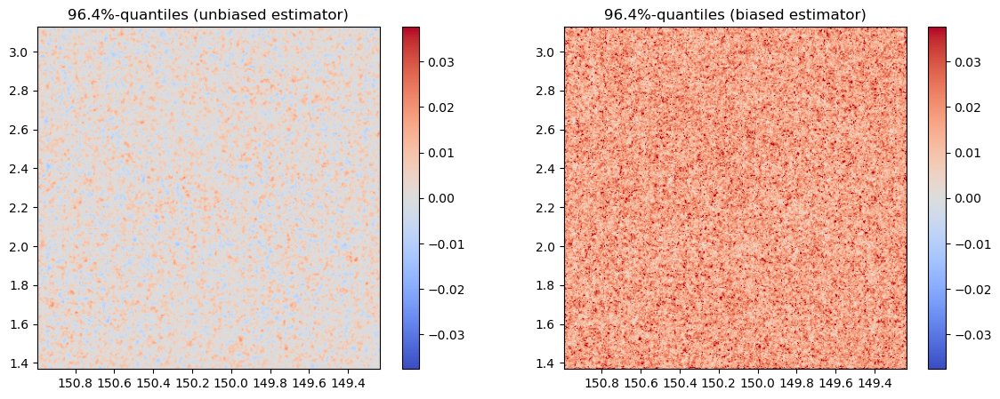

In [44]:
saturation = 0.4
maxval = saturation * max(
    -np.min(quantile_vals_unbiased), np.max(quantile_vals_unbiased),
    -np.min(quantile_vals_biased), np.max(quantile_vals_biased)
)

plt.figure(figsize=(14, 5))

plt.subplot(121)
plt.imshow(quantile_vals_unbiased, origin='lower', cmap='coolwarm', vmin=-maxval, vmax=maxval, extent=extent)
plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
plt.colorbar()
plt.title(f'{adjusted_quantile:.1%}-quantiles (unbiased estimator)')

plt.subplot(122)
plt.imshow(quantile_vals_biased, origin='lower', cmap='coolwarm', vmin=-maxval, vmax=maxval, extent=extent)
plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
plt.colorbar()
plt.title(f'{adjusted_quantile:.1%}-quantiles (biased estimator)')

plt.show()

Compute calibrated bounds:

In [45]:
kappa_lo_sfg_cqr_unbiased = kappa_lo_sfg - quantile_vals_unbiased
kappa_hi_sfg_cqr_unbiased = kappa_hi_sfg + quantile_vals_unbiased

kappa_lo_sfg_cqr_biased = kappa_lo_sfg - quantile_vals_biased
kappa_hi_sfg_cqr_biased = kappa_hi_sfg + quantile_vals_biased

In [46]:
list_of_arrs = [
    kappa_lo_sfg_cqr_unbiased, kappa_hi_sfg_cqr_unbiased,
    kappa_lo_sfg_cqr_biased, kappa_hi_sfg_cqr_biased
]

list_of_arrs_calib, list_of_arrs_test = [], []
for arr in list_of_arrs:
    arr_calib, arr_test = split_test_calib(arr, nimgs_calib)
    list_of_arrs_calib.append(arr_calib)
    list_of_arrs_test.append(arr_test)

kappa_lo_sfg_cqr_unbiased_calib, kappa_hi_sfg_cqr_unbiased_calib, \
    kappa_lo_sfg_cqr_biased_calib, kappa_hi_sfg_cqr_biased_calib = list_of_arrs_calib

kappa_lo_sfg_cqr_unbiased_test, kappa_hi_sfg_cqr_unbiased_test, \
    kappa_lo_sfg_cqr_biased_test, kappa_hi_sfg_cqr_biased_test = list_of_arrs_test

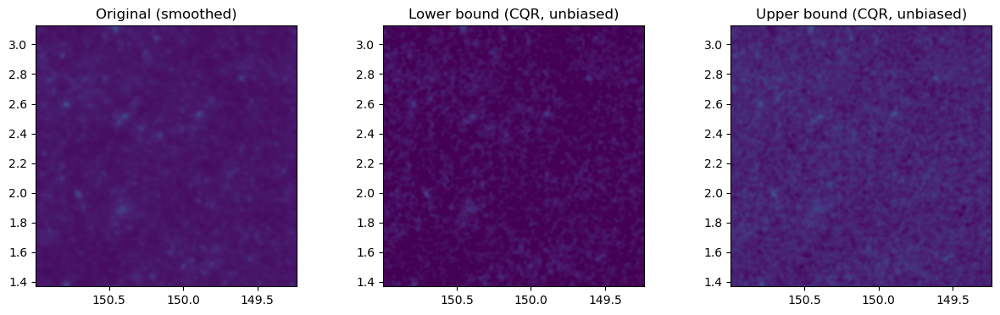

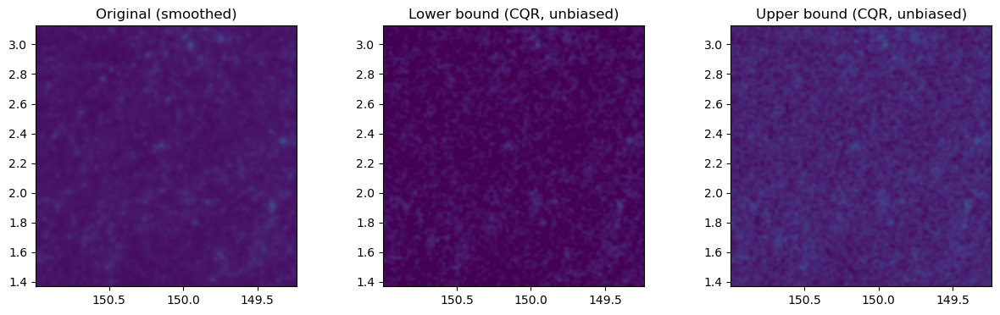

In [47]:
for i, idx in enumerate(rand_idx):
    ka_ori_smoothed = kappa_smoothed[idx] # original (smoothed)
    ka_lo = kappa_lo_sfg_cqr_unbiased[idx] # lower bound
    ka_hi = kappa_hi_sfg_cqr_unbiased[idx] # upper bound

    plt.figure(figsize=(15, 4))

    plt.subplot(131)
    plt.imshow(ka_ori_smoothed, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.title("Original (smoothed)")

    plt.subplot(132)
    plt.imshow(ka_lo, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.title("Lower bound (CQR, unbiased)")

    plt.subplot(133)
    plt.imshow(ka_hi, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.title("Upper bound (CQR, unbiased)")

    plt.show()

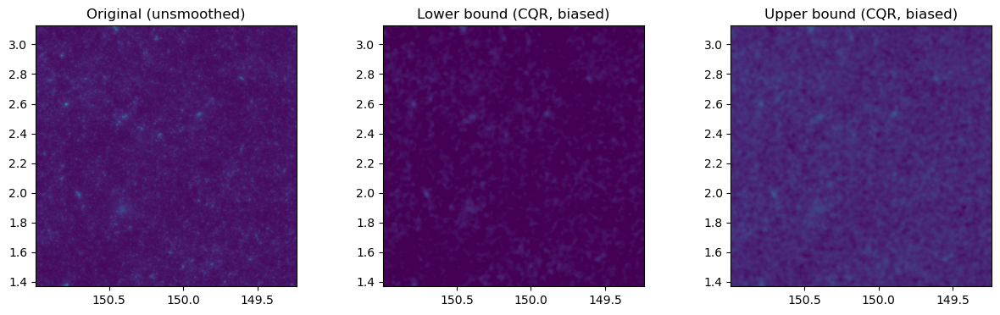

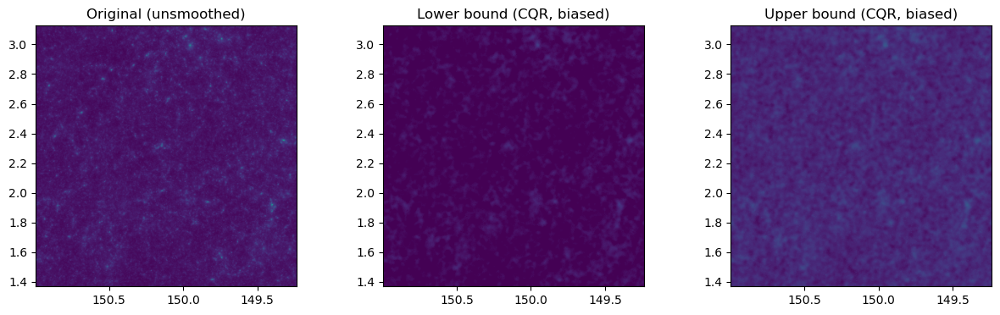

In [48]:
for i, idx in enumerate(rand_idx):
    ka_ori = kappa[idx] # original
    ka_lo = kappa_lo_sfg_cqr_biased[idx] # lower bound
    ka_hi = kappa_hi_sfg_cqr_biased[idx] # upper bound

    plt.figure(figsize=(15, 4))

    plt.subplot(131)
    plt.imshow(ka_ori, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.title("Original (unsmoothed)")

    plt.subplot(132)
    plt.imshow(ka_lo, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.title("Lower bound (CQR, biased)")

    plt.subplot(133)
    plt.imshow(ka_hi, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.title("Upper bound (CQR, biased)")

    plt.show()

#### Accuracy of the prediction intervals (CQR)

Unbiased estimator (prediction bounds for $S\kappa$):

In [49]:
losses_sfg_cqr_unbiased_test = loss(
    kappa_smoothed_test, kappa_lo_sfg_cqr_unbiased_test, kappa_hi_sfg_cqr_unbiased_test,
    axis=(1, 2)
)

print(f"Mean value = {np.mean(losses_sfg_cqr_unbiased_test):.1e}")
print(f"Standard deviation = {np.std(losses_sfg_cqr_unbiased_test):.1e}")
print(f"Target = {alpha:.1e}")

Mean value = 4.5e-02
Standard deviation = 2.4e-03
Target = 4.6e-02


Biased estimator (prediction bounds for $\kappa$):

In [50]:
losses_sfg_cqr_biased_test = loss(
    kappa_test, kappa_lo_sfg_cqr_biased_test, kappa_hi_sfg_cqr_biased_test,
    axis=(1, 2)
)

print(f"Mean value = {np.mean(losses_sfg_cqr_biased_test):.1e}")
print(f"Standard deviation = {np.std(losses_sfg_cqr_biased_test):.1e}")
print(f"Target = {alpha:.1e}")

Mean value = 4.6e-02
Standard deviation = 2.5e-03
Target = 4.6e-02


Lower bound proba = 3.6%
Upper bound proba = 4.6%
Empirical mean loss (unbiased estimator) = 4.5%
Empirical mean loss (biased estimator) = 4.6%


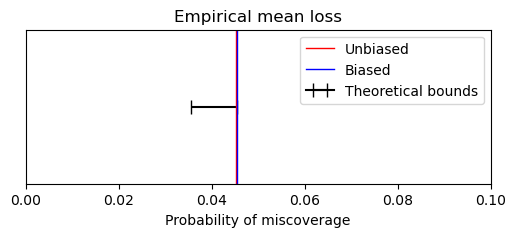

In [51]:
lower_bound_proba = alpha - 1 / (nimgs_calib + 1)
upper_bound_proba = alpha
mid_proba = (upper_bound_proba + lower_bound_proba) / 2
mean_loss_cqr_unbiased = np.mean(losses_sfg_cqr_unbiased_test)
mean_loss_cqr_biased = np.mean(losses_sfg_cqr_biased_test)

print(f"Lower bound proba = {lower_bound_proba:.1%}")
print(f"Upper bound proba = {upper_bound_proba:.1%}")
print(f"Empirical mean loss (unbiased estimator) = {mean_loss_cqr_unbiased:.1%}")
print(f"Empirical mean loss (biased estimator) = {mean_loss_cqr_biased:.1%}")

fig, ax = plt.subplots(figsize=(6, 2))
ax.errorbar(
    mid_proba, 0, xerr=[[mid_proba - lower_bound_proba], [upper_bound_proba - mid_proba]],
    fmt='', color='black', capsize=5, label="Theoretical bounds"
)
ax.axvline(
    x=mean_loss_cqr_unbiased, color='red', linestyle='solid', linewidth=1., label='Unbiased'
)
ax.axvline(
    x=mean_loss_cqr_biased, color='blue', linestyle='solid', linewidth=1., label='Biased'
)
ax.set_xlim(0., 0.1)
ax.set_xlabel('Probability of miscoverage')
ax.set_yticks([])
plt.legend()
plt.title("Empirical mean loss")
plt.show()

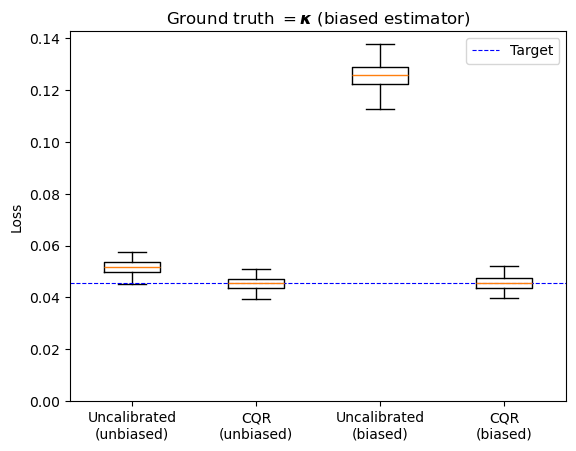

In [52]:
xticklabels = ["Uncalibrated\n(unbiased)", "CQR\n(unbiased)", "Uncalibrated\n(biased)", "CQR\n(biased)"]

plt.boxplot([
    losses_sfg_unbiased_test, losses_sfg_cqr_unbiased_test,
    losses_sfg_biased_test, losses_sfg_cqr_biased_test
])
plt.ylim(bottom=0.)
plt.xticks([1, 2, 3, 4], xticklabels)
plt.ylabel("Loss")
plt.axhline(y=alpha, color='blue', linestyle='--', linewidth=0.8, label='Target')
plt.legend()
plt.title(r"Ground truth $= \boldsymbol{\kappa}$ (biased estimator)")
plt.show()

<a id="cqr_losses_biased"></a>

Length of the prediction intervals:

In [53]:
predinterval_uncalibrated = 2 * ppf_sfg
predinterval_cqr_unbiased = predinterval_uncalibrated + 2 * quantile_vals_unbiased
predinterval_cqr_biased = predinterval_uncalibrated + 2 * quantile_vals_biased

print(f"Mean length of prediction sets (uncalibrated): {np.mean(predinterval_uncalibrated):.2e}.")
print(f"Mean length of prediction sets (CQR, unbiased estimator): {np.mean(predinterval_cqr_unbiased):.2e}.")
print(f"Mean length of prediction sets (CQR, biased estimator): {np.mean(predinterval_cqr_biased):.2e}.")

Mean length of prediction sets (uncalibrated): 8.51e-02.
Mean length of prediction sets (CQR, unbiased estimator): 8.92e-02.
Mean length of prediction sets (CQR, biased estimator): 1.19e-01.


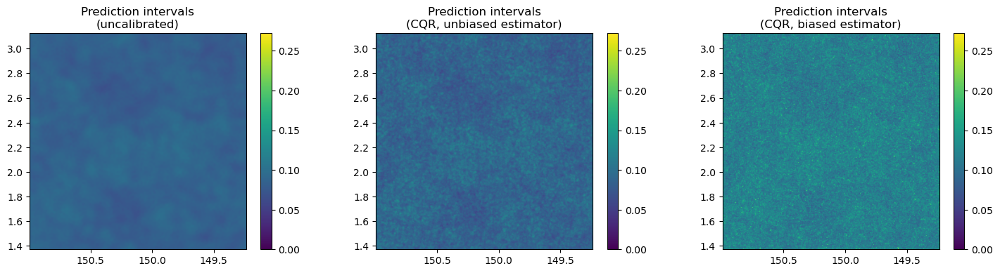

In [54]:
saturation = 1.
maxval = saturation * max(
    np.max(predinterval_uncalibrated), np.max(predinterval_cqr_unbiased), np.max(predinterval_cqr_biased),
)

plt.figure(figsize=(18, 4))

plt.subplot(131)
plt.imshow(predinterval_uncalibrated, origin='lower', vmin=0., vmax=maxval, extent=extent)
plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
plt.colorbar()
plt.title(f'Prediction intervals\n(uncalibrated)')

plt.subplot(132)
plt.imshow(predinterval_cqr_unbiased, origin='lower', vmin=0., vmax=maxval, extent=extent)
plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
plt.colorbar()
plt.title(f'Prediction intervals\n(CQR, unbiased estimator)')

plt.subplot(133)
plt.imshow(predinterval_cqr_biased, origin='lower', vmin=0., vmax=maxval, extent=extent)
plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
plt.colorbar()
plt.title(f'Prediction intervals\n(CQR, biased estimator)')

plt.show()

<a id="cqr_predinterv"></a>

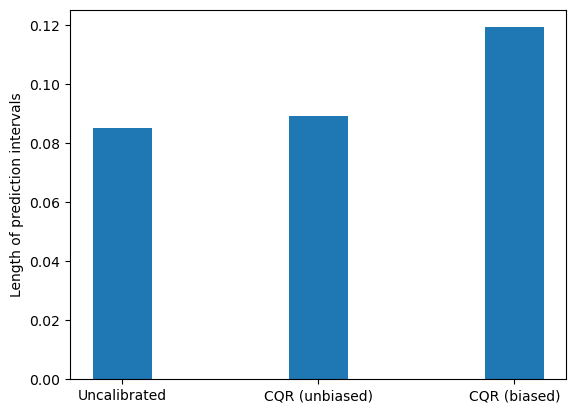

In [55]:
xticks = range(3)
plt.bar(xticks, [
    np.mean(predinterval_uncalibrated), np.mean(predinterval_cqr_unbiased), np.mean(predinterval_cqr_biased)
], width=0.3)
plt.xticks(xticks, labels=["Uncalibrated", "CQR (unbiased)", "CQR (biased)"])
plt.ylabel("Length of prediction intervals")
plt.show()